<a href="https://colab.research.google.com/github/sileysa/PCVK26_26_SILEYSA/blob/main/P3_26_SileysaFaedatulNuraini.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Sel Identitas Wajib

In [ ]:
# ===== SEL IDENTITAS - JANGAN DIHAPUS, HARUS SEL PERTAMA =====

import sys
import platform
import hashlib
import datetime
import zoneinfo

NAMA = 'Sileysa Faedatul Nuraini'
NIM = '244107020231'

N = int(NIM[-3:])

PARAM = {
    'b': (N % 61) + 20,
    'a': round(1.0 + (N % 9) / 10, 1),
    'c': (N % 20) + 30,
    'gamma': round(0.4 + (N % 6) * 0.25, 2),
    'bit': (N % 6) + 2,
}

waktu = datetime.datetime.now(
    zoneinfo.ZoneInfo('Asia/Jakarta')
)

print('NAMA :', NAMA)
print('NIM :', NIM, '| N =', N)

for k, v in PARAM.items():
    print('%-6s :' % k, v)

print('WAKTU :', waktu.strftime('%Y-%m-%d %H:%M:%S %Z'))
print('SISTEM :', sys.version.split()[0], platform.platform())

kunci = NIM + '|' + waktu.strftime('%Y-%m-%d')
print('TOKEN :', hashlib.sha256(kunci.encode()).hexdigest()[:16])

NAMA : Sileysa Faedatul Nuraini
NIM : 244107020231 | N = 231
b      : 68
a      : 1.6
c      : 41
gamma  : 1.15
bit    : 5
WAKTU : 2026-09-18 22:46:38 WIB
SISTEM : 3.13.15 Linux-6.6.122+-x86_64-with-glibc2.39
TOKEN : 7f446f7129c3cd46


# Import Library

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import glob
import os

from math import log10, sqrt

# Mount Google Drive

In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Menentukan Folder Citra

In [ ]:
BASE = '/content/drive/MyDrive/PCVK/Images/244107020231'

print("Folder citra:", BASE)

Folder citra: /content/drive/MyDrive/PCVK/Images/244107020231


In [ ]:
print(os.listdir(BASE))

['KTP1b.jpg', 'KTP1d.jpg', 'houses.jpg', 'OBJ1.jpg', 'KTP1a.jpg', 'KTP1c.jpg', 'NIGHT1.jpg', 'NIGHT2.jpg']


# Membaca Citra

In [ ]:
KTP1a = cv.imread(BASE + '/KTP1a.jpg')
KTP1b = cv.imread(BASE + '/KTP1b.jpg')
KTP1c = cv.imread(BASE + '/KTP1c.jpg')
KTP1d = cv.imread(BASE + '/KTP1d.jpg')
OBJ1 = cv.imread(BASE + '/OBJ1.jpg')
NIGHT1 = cv.imread(BASE + '/NIGHT1.jpg')

print("KTP1a:", KTP1a.shape)
print("KTP1b:", KTP1b.shape)
print("KTP1c:", KTP1c.shape)
print("KTP1d:", KTP1d.shape)
print("OBJ1 :", OBJ1.shape)
print("NIGHT1:", NIGHT1.shape)

KTP1a: (987, 1565, 3)
KTP1b: (975, 1600, 3)
KTP1c: (1001, 1562, 3)
KTP1d: (987, 1600, 3)
OBJ1 : (1579, 944, 3)
NIGHT1: (1567, 1187, 3)


# Fungsi Menampilkan Citra

In [ ]:
def tampilkan(img, judul, cmap=None):
    plt.figure(figsize=(8, 6))

    if cmap:
        plt.imshow(img, cmap=cmap)
    else:
        plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))

    plt.title(NIM + ' - ' + judul)
    plt.axis('off')
    plt.show()

# PRAKTIKUM TRANSFORMASI LINEAR BRIGHTNESS

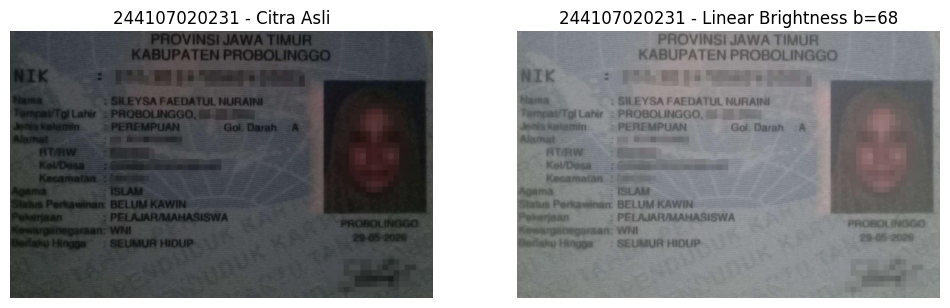

In [ ]:
brightness = PARAM['b']

original = cv.imread(BASE + '/KTP1a.jpg')

# Konversi ke int16 agar tidak terjadi wrap-around uint8
bright_image = original.astype(np.int16) + brightness

# Truncate / clipping agar nilai tetap berada pada 0-255
bright_image = np.clip(bright_image, 0, 255)

# Kembalikan ke uint8
bright_image = bright_image.astype(np.uint8)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(original, cv.COLOR_BGR2RGB))
plt.title(NIM + ' - Citra Asli')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(bright_image, cv.COLOR_BGR2RGB))
plt.title(NIM + ' - Linear Brightness b=' + str(brightness))
plt.axis('off')

plt.show()

# TUGAS 1 - INVERSE CITRA

# Membaca KTM1a dan KTM1b

In [ ]:
KTP1a = cv.imread(BASE + '/KTP1a.jpg')
KTP1b = cv.imread(BASE + '/KTP1b.jpg')

print("KTP1a berhasil dibaca:", KTP1a.shape)
print("KTP1b berhasil dibaca:", KTP1b.shape)

KTP1a berhasil dibaca: (987, 1565, 3)
KTP1b berhasil dibaca: (975, 1600, 3)


# Implementasi Inverse

In [ ]:
inverse_KTP1a = 255 - KTP1a
inverse_KTP1b = 255 - KTP1b

# Menampilkan Hasil Tugas 1

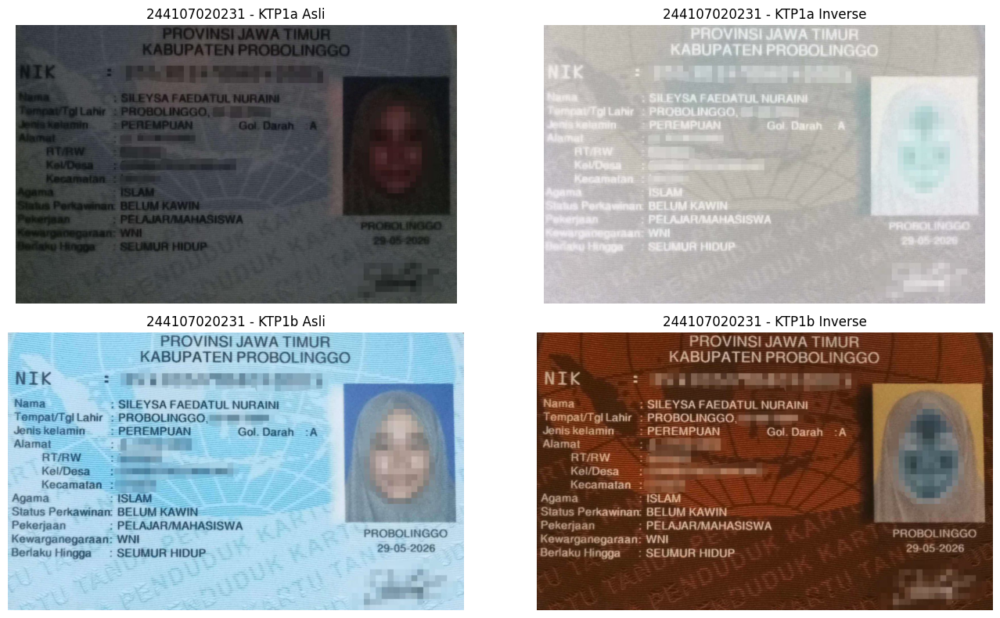

In [ ]:
plt.figure(figsize=(14, 8))

plt.subplot(2, 2, 1)
plt.imshow(cv.cvtColor(KTP1a, cv.COLOR_BGR2RGB))
plt.title(NIM + ' - KTP1a Asli')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(cv.cvtColor(inverse_KTP1a, cv.COLOR_BGR2RGB))
plt.title(NIM + ' - KTP1a Inverse')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(cv.cvtColor(KTP1b, cv.COLOR_BGR2RGB))
plt.title(NIM + ' - KTP1b Asli')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(cv.cvtColor(inverse_KTP1b, cv.COLOR_BGR2RGB))
plt.title(NIM + ' - KTP1b Inverse')
plt.axis('off')

plt.tight_layout()
plt.show()

Pada KTP1a yang diambil dalam ruangan gelap, hasil inverse cenderung tampak pucat dan berkabut karena citra aslinya memiliki intensitas yang rendah. Operasi inverse membalik intensitas menggunakan rumus 255 - f(x,y), sehingga area yang sebelumnya gelap menjadi lebih terang. Sementara itu, KTP1b yang memiliki pencahayaan lampu ruangan mempunyai distribusi intensitas yang lebih baik sehingga hasil inversenya tetap menunjukkan kontras yang lebih jelas.

# TUGAS 2 - TRANSFORMASI CONTRAST

In [ ]:
PARAM['a']

1.6

# Implementasi Contrast

In [ ]:
original = cv.imread(BASE + '/KTP1a.jpg')

a = PARAM['a']

contrast_image = a * (
    original.astype(np.float32) - 128
) + 128

contrast_image = np.clip(
    contrast_image,
    0,
    255
).astype(np.uint8)

# Menampilkan Contrast

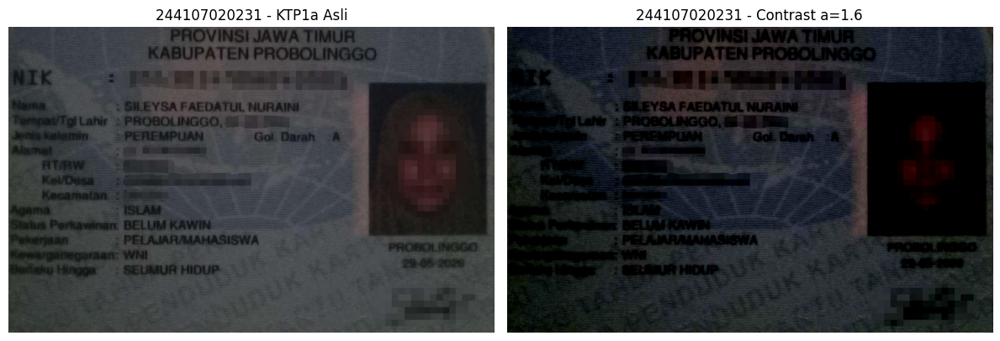

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(original, cv.COLOR_BGR2RGB))
plt.title(NIM + ' - KTP1a Asli')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(contrast_image, cv.COLOR_BGR2RGB))
plt.title(NIM + ' - Contrast a=' + str(a))
plt.axis('off')

plt.tight_layout()
plt.show()

# TUGAS 3 - LOGARITHMIC BRIGHTNESS

# Logarithmic Brightness

In [ ]:
original = cv.imread(BASE + '/KTP1a.jpg')

c = PARAM['c']

# Konversi ke float
original_float = original.astype(np.float32)

# Transformasi log
log_image = c * np.log1p(original_float)

# Normalisasi hasil ke 0-255
log_image = cv.normalize(
    log_image,
    None,
    0,
    255,
    cv.NORM_MINMAX
)

log_image = log_image.astype(np.uint8)

# Linear Brightness untuk Perbandingan

In [ ]:
b = PARAM['b']

linear_image = original.astype(np.int16) + b
linear_image = np.clip(linear_image, 0, 255)
linear_image = linear_image.astype(np.uint8)

# Perbandingan Linear dan Logarithmic

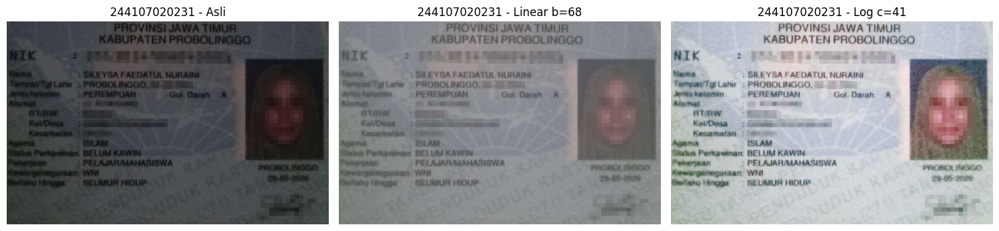

In [ ]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(cv.cvtColor(original, cv.COLOR_BGR2RGB))
plt.title(NIM + ' - Asli')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cv.cvtColor(linear_image, cv.COLOR_BGR2RGB))
plt.title(NIM + ' - Linear b=' + str(b))
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cv.cvtColor(log_image, cv.COLOR_BGR2RGB))
plt.title(NIM + ' - Log c=' + str(c))
plt.axis('off')

plt.tight_layout()
plt.show()

Linear Brightness dengan b=68 mampu meningkatkan kecerahan KTP1a sehingga informasi pada kartu menjadi lebih terlihat dibandingkan citra asli. Namun, Logarithmic Brightness dengan c=41 memberikan hasil yang lebih efektif untuk citra yang gelap karena detail pada area gelap menjadi lebih terlihat dan nama lebih mudah terbaca. Kekurangannya, hasil Logarithmic Brightness terlihat lebih terang dan cenderung pucat pada beberapa bagian kartu. Oleh karena itu, untuk KTP1a, metode Logarithmic Brightness c=41 lebih efektif dalam meningkatkan keterbacaan nama dibandingkan Linear Brightness b=68.

# TUGAS 4 - GRAYSCALE

# Membaca KTM1c

In [ ]:
KTP1c = cv.imread(BASE + '/KTP1c.jpg')

# OpenCV menggunakan urutan BGR
B, G, R = cv.split(KTP1c)

# Grayscale Averaging

In [ ]:
averaging = (
    R.astype(np.float32) +
    G.astype(np.float32) +
    B.astype(np.float32)
) / 3

averaging = averaging.astype(np.uint8)

# Grayscale Lightness

In [ ]:
lightness = (
    np.maximum.reduce([R, G, B]).astype(np.float32) +
    np.minimum.reduce([R, G, B]).astype(np.float32)
) / 2

lightness = lightness.astype(np.uint8)

# Grayscale Luminance

In [ ]:
luminance = (
    0.21 * R.astype(np.float32) +
    0.72 * G.astype(np.float32) +
    0.07 * B.astype(np.float32)
)

luminance = np.clip(
    luminance,
    0,
    255
).astype(np.uint8)

# Menampilkan Ketiga Grayscale

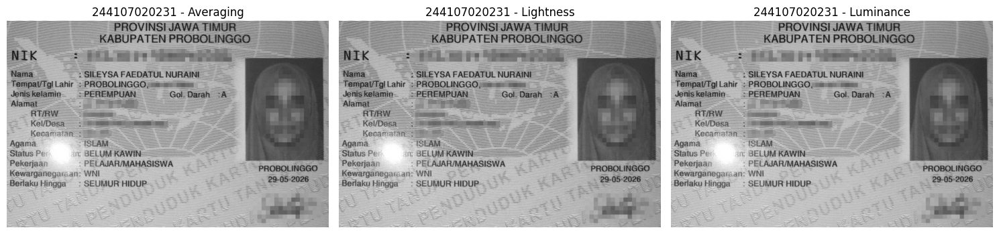

In [ ]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(averaging, cmap='gray')
plt.title(NIM + ' - Averaging')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(lightness, cmap='gray')
plt.title(NIM + ' - Lightness')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(luminance, cmap='gray')
plt.title(NIM + ' - Luminance')
plt.axis('off')

plt.tight_layout()
plt.show()

Berdasarkan hasil percobaan, metode Averaging memberikan pemisahan paling jelas antara teks dan latar kartu. Pada hasil Averaging, teks terlihat lebih gelap sedangkan latar kartu relatif lebih terang sehingga kontras antara keduanya lebih mudah diamati. Metode Lightness dan Luminance juga mampu menampilkan detail teks, tetapi berdasarkan pengamatan visual pada hasil percobaan, pemisahannya tidak sejelas metode Averaging. Oleh karena itu, metode Averaging dipilih sebagai metode yang paling efektif untuk memisahkan teks dan latar pada KTP1c.

# Menghitung Rata-rata dan Simpangan Baku

In [ ]:
data_grayscale = {
    'Averaging': averaging,
    'Lightness': lightness,
    'Luminance': luminance
}

for nama, image in data_grayscale.items():
    mean = np.mean(image)
    std = np.std(image)

    print(nama)
    print('Rata-rata      :', mean)
    print('Simpangan baku :', std)
    print()

Averaging
Rata-rata      : 160.7409069803436
Simpangan baku : 42.50212291887035

Lightness
Rata-rata      : 157.09796861269334
Simpangan baku : 42.19062725942508

Luminance
Rata-rata      : 160.72642978020698
Simpangan baku : 42.965384751446834



# TUGAS 5 - MENAMPILKAN SATU WARNA

# Membaca OBJ1 dan Mengubah ke HSV

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Membaca gambar OBJ1
obj = cv2.imread('/content/drive/MyDrive/PCVK/Images/244107020231/OBJ1.jpg')

# Cek apakah gambar berhasil dibaca
if obj is None:
    print("OBJ1.jpg tidak ditemukan. Periksa path gambar.")
else:
    print("OBJ1.jpg berhasil dibaca.")
    print("Ukuran gambar:", obj.shape)

# Konversi BGR ke HSV
hsv = cv2.cvtColor(obj, cv2.COLOR_BGR2HSV)

OBJ1.jpg berhasil dibaca.
Ukuran gambar: (1579, 944, 3)


# Menentukan Rentang HSV

In [ ]:
lower_cyan = np.array([85, 80, 80])
upper_cyan = np.array([110, 255, 255])

# Membuat mask berdasarkan rentang HSV
mask = cv2.inRange(hsv, lower_cyan, upper_cyan)

print("Rentang HSV yang digunakan:")
print("Hue        : 85 - 110")
print("Saturation : 80 - 255")
print("Value      : 80 - 255")

Rentang HSV yang digunakan:
Hue        : 85 - 110
Saturation : 80 - 255
Value      : 80 - 255


# Mengubah bagian lain menjadi grayscale

In [ ]:
# Mengubah gambar menjadi grayscale
gray = cv2.cvtColor(obj, cv2.COLOR_BGR2GRAY)

# Mengubah grayscale menjadi 3 channel
gray_bgr = cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)

# Mempertahankan warna cyan,
# sedangkan bagian lain menggunakan grayscale
result = np.where(
    mask[:, :, np.newaxis] == 255,
    obj,
    gray_bgr
).astype(np.uint8)

# Menampilkan hasil

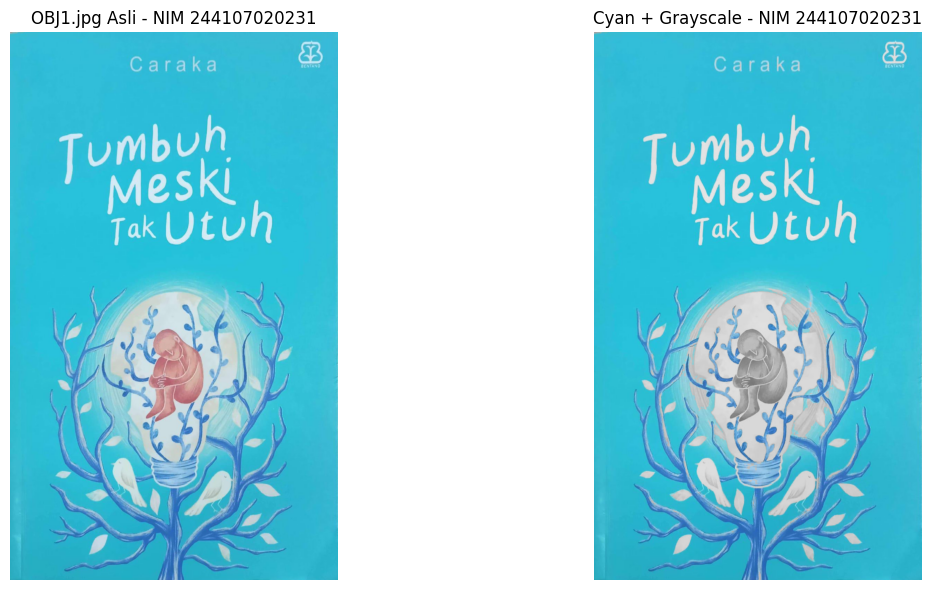

In [ ]:
plt.figure(figsize=(14, 6))

# Citra asli
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(obj, cv2.COLOR_BGR2RGB))
plt.title('OBJ1.jpg Asli - NIM 244107020231')
plt.axis('off')

# Hasil color masking
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.title('Cyan + Grayscale - NIM 244107020231')
plt.axis('off')

plt.tight_layout()
plt.show()

### Menampilkan Hasil Tugas 5 - Masking Warna Tunggal

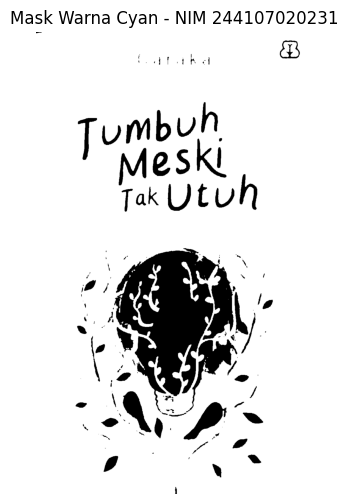

In [ ]:
plt.figure(figsize=(7, 6))

plt.imshow(mask, cmap='gray')
plt.title('Mask Warna Cyan - NIM 244107020231')
plt.axis('off')

plt.show()

Piksel yang berada dalam rentang tersebut dipertahankan dalam warna asli, sedangkan piksel di luar rentang diubah menjadi grayscale. Pelebaran rentang HSV menyebabkan lebih banyak variasi warna yang mendekati cyan ikut dipertahankan, sedangkan penyempitan rentang menyebabkan sebagian warna cyan tidak lagi terdeteksi dan berubah menjadi grayscale.

# TUGAS 6 - GAMMA CORRECTION

# Gamma Correction

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Membaca KTP1a
ktp1a = cv2.imread(
    '/content/drive/MyDrive/PCVK/Images/244107020231/KTP1a.jpg'
)

if ktp1a is None:
    print("KTP1a.jpg tidak ditemukan. Periksa path gambar.")
else:
    print("KTP1a.jpg berhasil dibaca.")
    print("Ukuran gambar:", ktp1a.shape)

KTP1a.jpg berhasil dibaca.
Ukuran gambar: (987, 1565, 3)


In [ ]:
print(' Gamma Correction pada citra ')
print('----------------------------------')
try:
    gamma = int(input('Masukkan nilai Gamma: '))
except ValueError:
    print('Error, not a number')

 Gamma Correction pada citra 
----------------------------------
Masukkan nilai Gamma: 1.5
Error, not a number


# Fungsi Gamma Correction

In [ ]:
def gamma_correction(image, gamma):
    """
    Melakukan Gamma Correction pada citra.
    """

    # Normalisasi nilai piksel ke 0-1
    normalized = image / 255.0

    # Transformasi gamma
    corrected = np.power(normalized, gamma)

    # Mengembalikan ke rentang 0-255
    corrected = np.uint8(corrected * 255)

    return corrected

# Menerapkan gamma hasil NIM

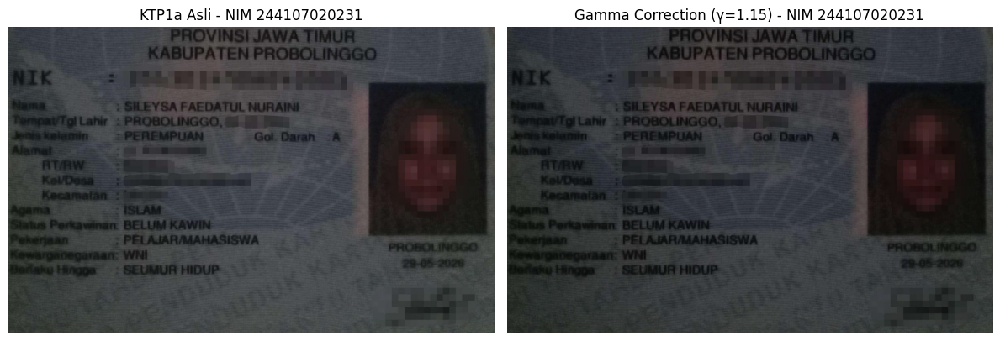

In [ ]:
gamma_nim = PARAM['gamma']
gamma_result = gamma_correction(ktp1a, gamma_nim)

plt.figure(figsize=(12, 5))

# Citra asli
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(ktp1a, cv2.COLOR_BGR2RGB))
plt.title('KTP1a Asli - NIM 244107020231')
plt.axis('off')

# Hasil gamma
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(gamma_result, cv2.COLOR_BGR2RGB))
plt.title(f'Gamma Correction (γ={gamma_nim}) - NIM 244107020231')
plt.axis('off')

plt.tight_layout()
plt.show()

# Mencoba Minimal 5 Gamma

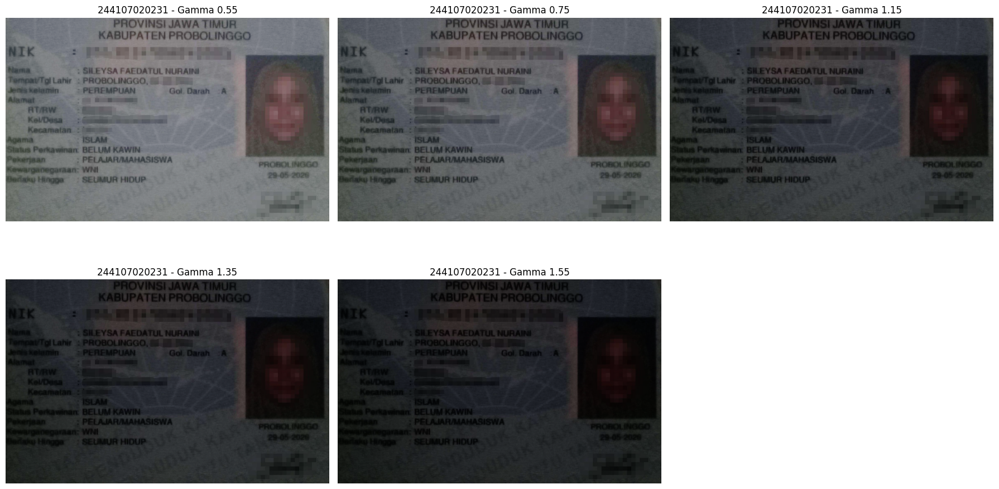

In [ ]:
original = cv.imread(BASE + '/KTP1a.jpg')

gamma_values = [
    0.55,
    0.75,
    1.15,
    1.35,
    1.55
]

plt.figure(figsize=(18, 10))

for i, gamma in enumerate(gamma_values):

    result = gamma_correction(
        original,
        gamma
    )

    plt.subplot(2, 3, i + 1)

    plt.imshow(
        cv.cvtColor(result, cv.COLOR_BGR2RGB)
    )

    plt.title(
        NIM + ' - Gamma ' + str(gamma)
    )

    plt.axis('off')

plt.tight_layout()
plt.show()

# Menentukan Gamma Terbaik

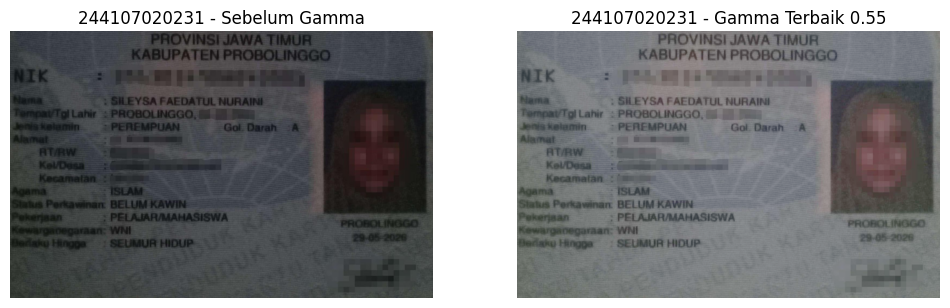

In [ ]:
gamma_terbaik = 0.55

hasil_gamma_terbaik = gamma_correction(
    original,
    gamma_terbaik
)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(original, cv.COLOR_BGR2RGB))
plt.title(NIM + ' - Sebelum Gamma')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(hasil_gamma_terbaik, cv.COLOR_BGR2RGB))
plt.title(
    NIM + ' - Gamma Terbaik ' + str(gamma_terbaik)
)
plt.axis('off')

plt.show()

Berdasarkan hasil percobaan, nilai gamma terbaik yang dipilih adalah γ = 0,55 karena menghasilkan citra yang lebih terang dan membuat informasi pada kartu, khususnya nama, lebih mudah terbaca. Nilai gamma yang lebih besar seperti 0,75; 1,15; 1,35; dan 1,55 menghasilkan citra yang semakin gelap sehingga detail pada area gelap menjadi kurang terlihat. Nilai gamma terbaik setiap mahasiswa dapat berbeda meskipun menggunakan jenis objek yang sama karena setiap citra memiliki kondisi pencahayaan, posisi pengambilan gambar, kamera, serta distribusi intensitas piksel yang berbeda. Oleh karena itu, diperlukan penyesuaian nilai gamma berdasarkan karakteristik masing-masing citra.

# TUGAS 7 - SIMULASI IMAGE DEPTH

# Fungsi Image Depth

In [ ]:
def image_depth(image, bit_depth):

    level = 255 / (pow(2, bit_depth) - 1)

    depth_image = np.round(
        image / level
    ) * level

    depth_image = np.clip(
        depth_image,
        0,
        255
    )

    depth_image = depth_image.astype(np.uint8)

    return depth_image

# Image Depth 1–7 Bit

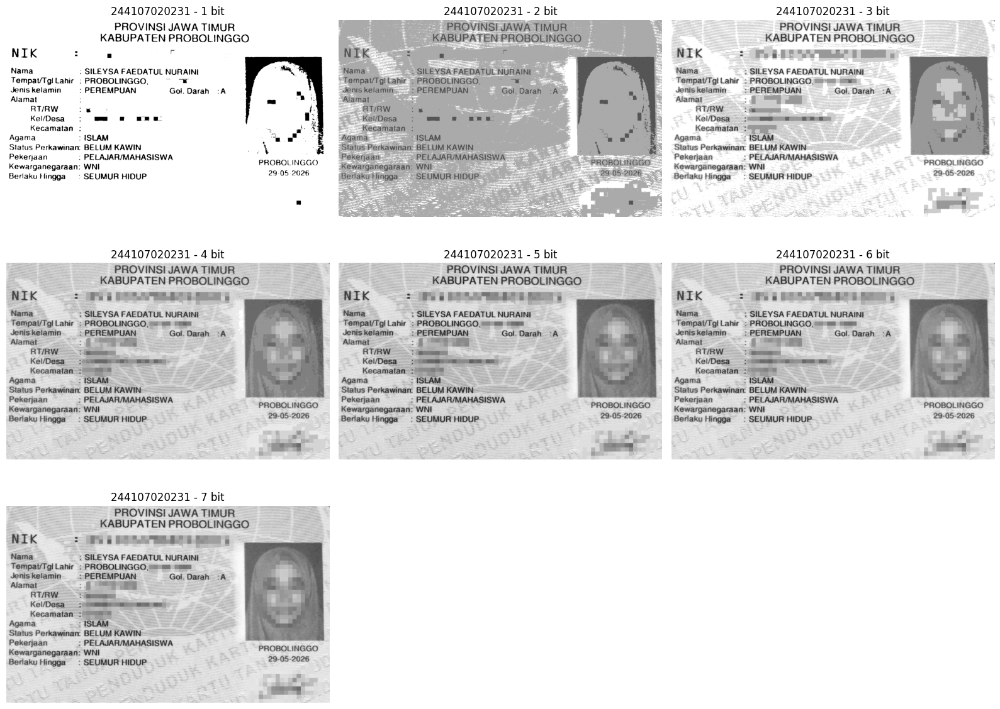

In [ ]:
original = cv.imread(
    BASE + '/KTP1b.jpg',
    cv.IMREAD_GRAYSCALE
)

plt.figure(figsize=(16, 12))

for bit_depth in range(1, 8):

    result = image_depth(
        original,
        bit_depth
    )

    plt.subplot(3, 3, bit_depth)

    plt.imshow(
        result,
        cmap='gray'
    )

    plt.title(
        NIM + ' - ' + str(bit_depth) + ' bit'
    )

    plt.axis('off')

plt.tight_layout()
plt.show()

# Image Depth Sesuai Parameter NIM

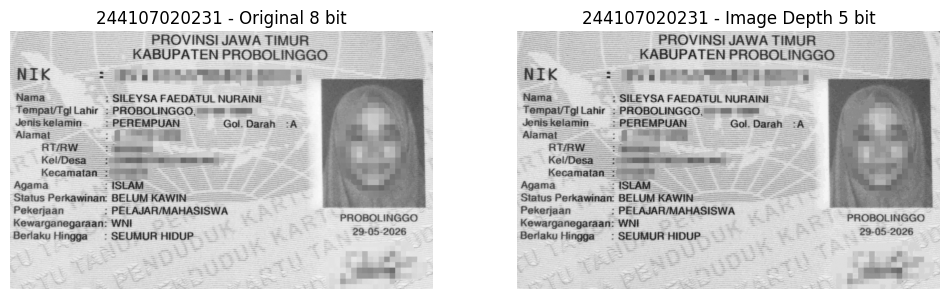

In [ ]:
bit_depth = PARAM['bit']

depth_NIM = image_depth(
    original,
    bit_depth
)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(original, cmap='gray')
plt.title(NIM + ' - Original 8 bit')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(depth_NIM, cmap='gray')
plt.title(
    NIM + ' - Image Depth ' + str(bit_depth) + ' bit'
)
plt.axis('off')

plt.show()

Berdasarkan hasil percobaan, nama pada kartu masih terbaca pada kedalaman citra 5 bit. Pada kedalaman 5 bit terdapat 32 tingkat intensitas (2^5), sehingga jumlah variasi intensitas lebih sedikit dibandingkan citra asli 8 bit yang memiliki 256 tingkat intensitas. Pengurangan kedalaman bit menyebabkan beberapa detail dan gradasi pada kartu berkurang, tetapi bentuk huruf pada nama masih dapat dibedakan dengan cukup jelas dari latar belakang. Dengan demikian, untuk citra KTP1b yang digunakan, kedalaman 5 bit masih mempertahankan informasi penting berupa nama.

# TUGAS 8 - AVERAGE DENOISING

# Membaca Citra Galaxy

In [ ]:
original = cv.imread(
    '/content/drive/MyDrive/PCVK/Images/galaxy.jpg'
)

print("Ukuran original:", original.shape)

Ukuran original: (256, 310, 3)


# Membaca Semua Citra Noise

In [ ]:
noise_path = '/content/drive/MyDrive/PCVK/Images/noises/*.jpg'

cv_img = []

for img in glob.glob(noise_path):
    n = cv.imread(img)
    cv_img.append(n)

print("Jumlah citra noise:", len(cv_img))

Jumlah citra noise: 100


# Fungsi Average Denoising

In [ ]:
def average_denoising(images):

    images_float = [
        img.astype(np.float32)
        for img in images
    ]

    average = np.mean(
        images_float,
        axis=0
    )

    average = np.clip(
        average,
        0,
        255
    ).astype(np.uint8)

    return average

# Fungsi PSNR

In [ ]:
def PSNR(img1, img2):

    img1 = img1.astype(np.float64)
    img2 = img2.astype(np.float64)

    mse = np.mean(
        (img1 - img2) ** 2
    )

    if mse == 0:
        return float('inf')

    return 20 * log10(
        255.0 / sqrt(mse)
    )

# Average 10, 20, 40, 80, 100

In [ ]:
jumlah_citra = [10, 20, 40, 80, 100]

hasil_psnr = []

for jumlah in jumlah_citra:

    hasil_average = average_denoising(
        cv_img[:jumlah]
    )

    nilai_psnr = PSNR(
        original,
        hasil_average
    )

    hasil_psnr.append(
        nilai_psnr
    )

    print(
        'Jumlah citra:',
        jumlah,
        '| PSNR:',
        nilai_psnr,
        'dB'
    )

Jumlah citra: 10 | PSNR: 19.727854890986677 dB
Jumlah citra: 20 | PSNR: 19.837198403001665 dB
Jumlah citra: 40 | PSNR: 19.892837569107545 dB
Jumlah citra: 80 | PSNR: 19.91663435301917 dB
Jumlah citra: 100 | PSNR: 19.92196095594035 dB


# Menampilkan Hasil Denoising

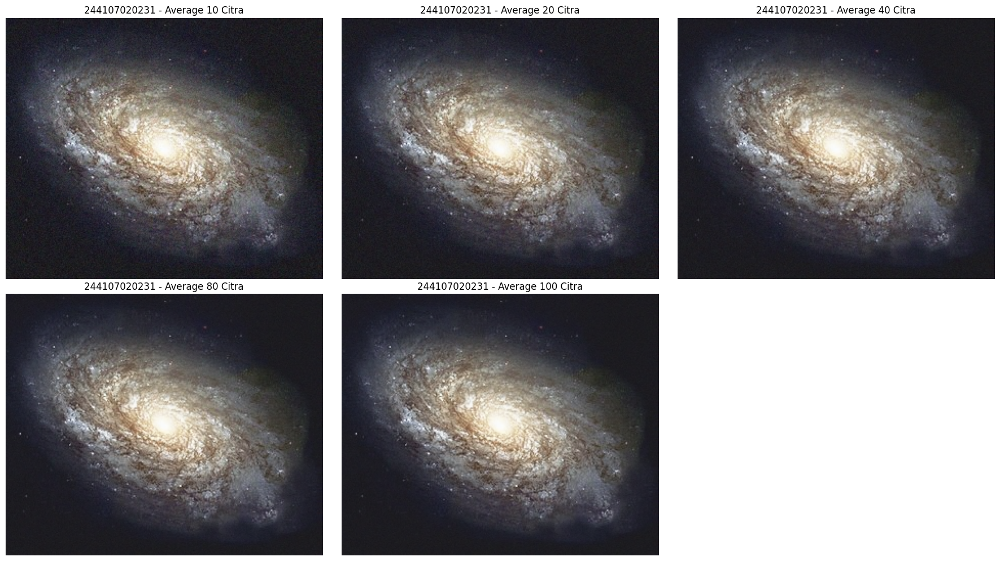

In [ ]:
plt.figure(figsize=(18, 10))

for i, jumlah in enumerate(jumlah_citra):

    hasil_average = average_denoising(
        cv_img[:jumlah]
    )

    plt.subplot(2, 3, i + 1)

    plt.imshow(
        cv.cvtColor(
            hasil_average,
            cv.COLOR_BGR2RGB
        )
    )

    plt.title(
        NIM +
        ' - Average ' +
        str(jumlah) +
        ' Citra'
    )

    plt.axis('off')

plt.tight_layout()
plt.show()

1. Apakah peningkatan jumlah citra selalu memberikan peningkatan PSNR yang signifikan?

Tidak selalu signifikan. Penambahan jumlah citra memang cenderung meningkatkan PSNR karena noise acak semakin tereduksi, tetapi peningkatannya semakin kecil ketika jumlah citra sudah banyak.

2. Pada jumlah citra berapa peningkatan mulai tidak terlalu signifikan?

Berdasarkan hasil visual yang kamu tampilkan, peningkatan mulai tidak terlalu signifikan sekitar 80 citra.

3. Kesimpulan

Berdasarkan percobaan Average Denoising, semakin banyak jumlah citra yang digunakan untuk proses averaging, noise pada citra semakin berkurang dan kualitas citra hasil denoising semakin baik. Peningkatan kualitas paling terlihat ketika jumlah citra bertambah dari 10 hingga 40 citra. Setelah mencapai sekitar 80 citra, peningkatan kualitas mulai tidak terlalu signifikan karena hasil Average 80 dan 100 citra terlihat sangat mirip. Hal ini menunjukkan bahwa menambahkan jumlah citra secara terus-menerus tidak selalu memberikan peningkatan kualitas yang besar. Dengan demikian, penggunaan sekitar 80 citra sudah memberikan hasil denoising yang baik, sedangkan penambahan hingga 100 citra hanya memberikan peningkatan yang relatif kecil.

# TUGAS 9 - IMAGE MASKING DATA PRIBADI

# Membaca KTM1d

In [ ]:
KTP1d = cv.imread(
    BASE + '/KTP1d.jpg'
)

height, width = KTP1d.shape[:2]

print("Width :", width)
print("Height:", height)

Width : 1600
Height: 987


# Membuat Mask Biner

In [ ]:
# Contoh koordinat
# x1, y1 = pojok kiri atas
# x2, y2 = pojok kanan bawah

x1_wajah = 1200
y1_wajah = 200
x2_wajah = 1550
y2_wajah = 620

x1_nim = 380
y1_nim = 230
x2_nim = 970
y2_nim = 280

In [ ]:
mask = np.zeros(
    KTP1d.shape[:2],
    dtype=np.uint8
)

mask[
    y1_wajah:y2_wajah,
    x1_wajah:x2_wajah
] = 255

mask[
    y1_nim:y2_nim,
    x1_nim:x2_nim
] = 255

# Menampilkan Mask

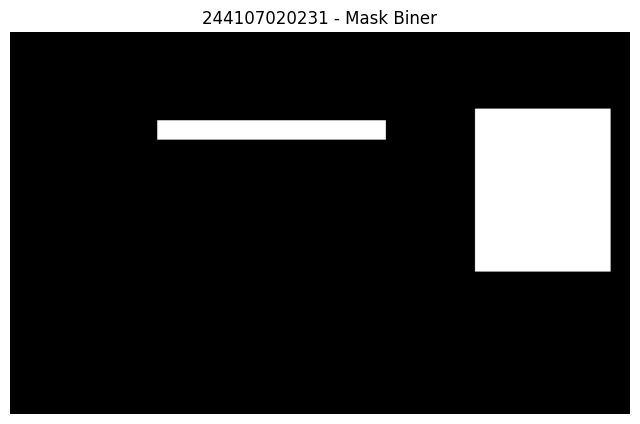

In [ ]:
plt.figure(figsize=(8, 6))

plt.imshow(
    mask,
    cmap='gray'
)

plt.title(
    NIM + ' - Mask Biner'
)

plt.axis('off')
plt.show()

# Masking dengan AND

In [ ]:
mask_3channel = cv.cvtColor(
    mask,
    cv.COLOR_GRAY2BGR
)

hasil_and = cv.bitwise_and(
    KTP1d,
    mask_3channel
)

# Menampilkan Hasil Masking

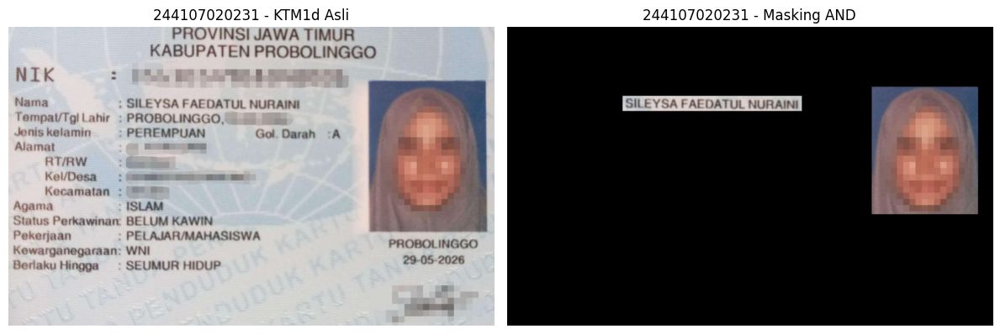

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)

plt.imshow(
    cv.cvtColor(
        KTP1d,
        cv.COLOR_BGR2RGB
    )
)

plt.title(
    NIM + ' - KTM1d Asli'
)

plt.axis('off')

plt.subplot(1, 2, 2)

plt.imshow(
    cv.cvtColor(
        hasil_and,
        cv.COLOR_BGR2RGB
    )
)

plt.title(
    NIM + ' - Masking AND'
)

plt.axis('off')

plt.tight_layout()
plt.show()

# Operator NOT

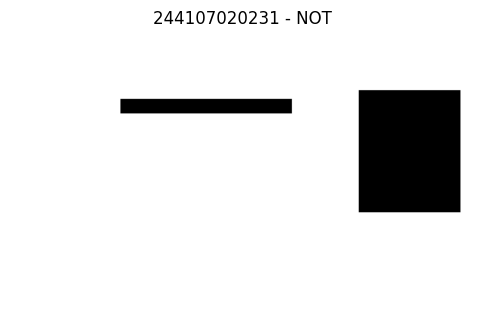

In [ ]:
hasil_not = cv.bitwise_not(mask)

plt.figure(figsize=(6, 5))

plt.imshow(
    hasil_not,
    cmap='gray'
)

plt.title(
    NIM + ' - NOT'
)

plt.axis('off')
plt.show()

# Operator OR

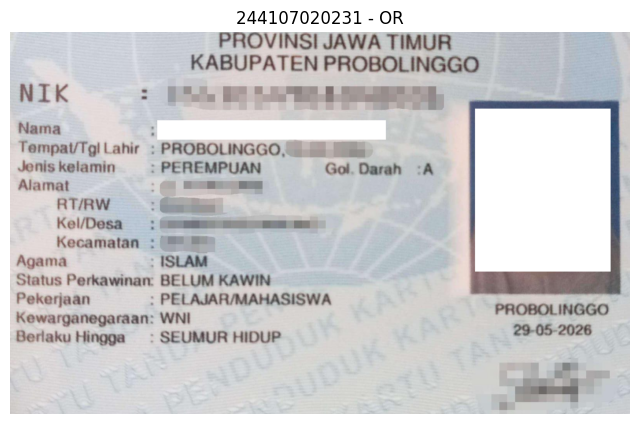

In [ ]:
hasil_or = cv.bitwise_or(
    KTP1d,
    mask_3channel
)

plt.figure(figsize=(8, 6))

plt.imshow(
    cv.cvtColor(
        hasil_or,
        cv.COLOR_BGR2RGB
    )
)

plt.title(
    NIM + ' - OR'
)

plt.axis('off')
plt.show()

# Operator AND

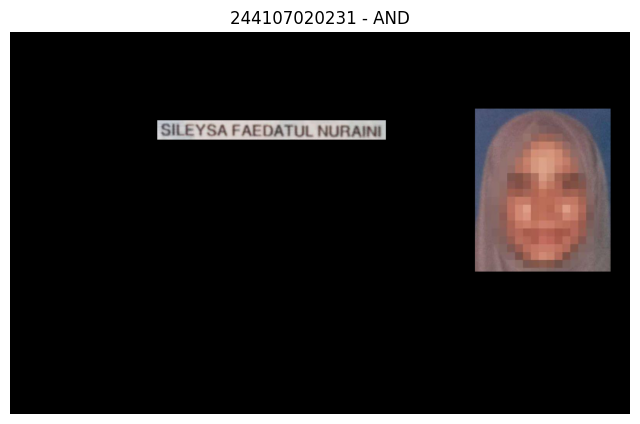

In [ ]:
hasil_and = cv.bitwise_and(
    KTP1d,
    mask_3channel
)

plt.figure(figsize=(8, 6))

plt.imshow(
    cv.cvtColor(
        hasil_and,
        cv.COLOR_BGR2RGB
    )
)

plt.title(
    NIM + ' - AND'
)

plt.axis('off')
plt.show()

# Operator NAND

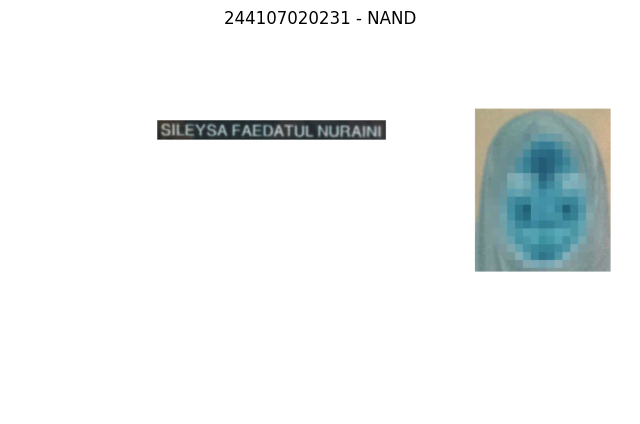

In [ ]:
hasil_nand = cv.bitwise_not(
    hasil_and
)

plt.figure(figsize=(8, 6))

plt.imshow(
    cv.cvtColor(
        hasil_nand,
        cv.COLOR_BGR2RGB
    )
)

plt.title(
    NIM + ' - NAND'
)

plt.axis('off')
plt.show()

# Operator XOR

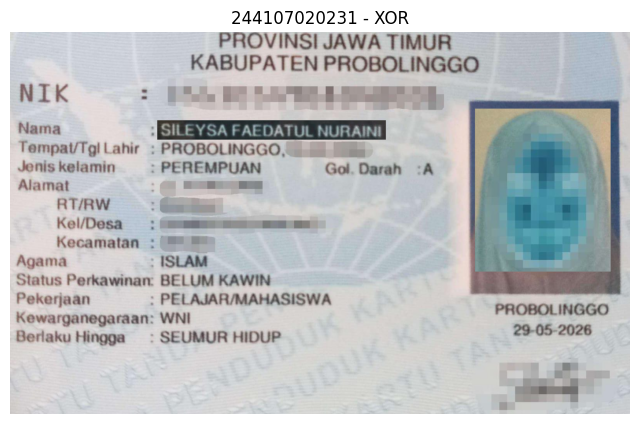

In [ ]:
hasil_xor = cv.bitwise_xor(
    KTP1d,
    mask_3channel
)

plt.figure(figsize=(8, 6))

plt.imshow(
    cv.cvtColor(
        hasil_xor,
        cv.COLOR_BGR2RGB
    )
)

plt.title(
    NIM + ' - XOR'
)

plt.axis('off')
plt.show()

Pada Tugas 9 dibuat mask biner untuk menyamarkan data pribadi pada KTP1d.jpg, yaitu area nama dan foto wajah. Mask dibuat dengan nilai 255 pada area yang tidak disamarkan dan nilai 0 pada area nama serta wajah. Operator AND digunakan sebagai metode utama masking karena area yang memiliki nilai mask 0 menghasilkan nilai piksel 0, sehingga kedua area tersebut menjadi hitam dan data pribadi tersamarkan. Pengujian operator NOT, OR, NAND, dan XOR menghasilkan tampilan yang berbeda karena masing-masing operator melakukan operasi logika piksel yang berbeda. Dari percobaan tersebut, operator AND sesuai digunakan untuk penyamaran karena dapat menghilangkan tampilan pada area yang ditentukan oleh mask.

# TUGAS 10 - FOTO MALAM HARI

# Membaca NIGHT1

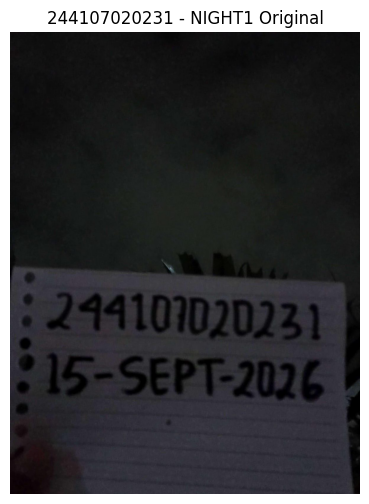

In [ ]:
NIGHT1 = cv.imread(
    BASE + '/NIGHT1.jpg'
)

plt.figure(figsize=(8, 6))

plt.imshow(
    cv.cvtColor(
        NIGHT1,
        cv.COLOR_BGR2RGB
    )
)

plt.title(
    NIM + ' - NIGHT1 Original'
)

plt.axis('off')
plt.show()

# Mencoba Linear Brightness

In [ ]:
night_linear = (
    NIGHT1.astype(np.int16) +
    PARAM['b']
)

night_linear = np.clip(
    night_linear,
    0,
    255
).astype(np.uint8)

# Mencoba Gamma Correction

In [ ]:
night_gamma = gamma_correction(
    NIGHT1,
    PARAM['gamma']
)

# Perbandingan Before-After

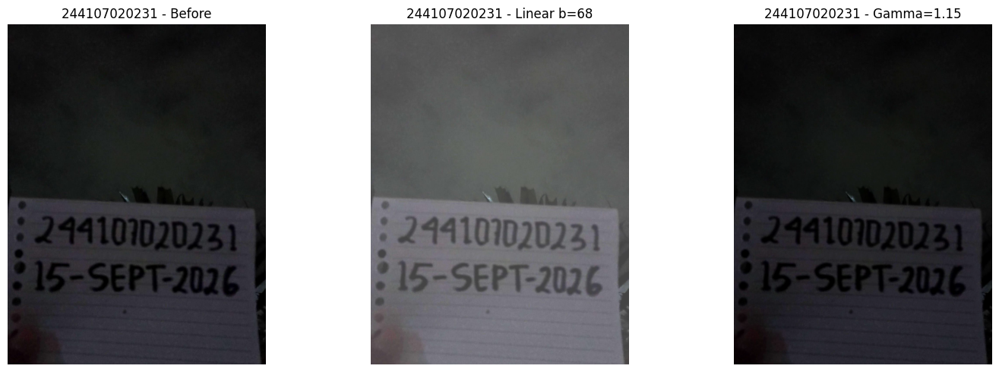

In [ ]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)

plt.imshow(
    cv.cvtColor(
        NIGHT1,
        cv.COLOR_BGR2RGB
    )
)

plt.title(
    NIM + ' - Before'
)

plt.axis('off')


plt.subplot(1, 3, 2)

plt.imshow(
    cv.cvtColor(
        night_linear,
        cv.COLOR_BGR2RGB
    )
)

plt.title(
    NIM + ' - Linear b=' +
    str(PARAM['b'])
)

plt.axis('off')


plt.subplot(1, 3, 3)

plt.imshow(
    cv.cvtColor(
        night_gamma,
        cv.COLOR_BGR2RGB
    )
)

plt.title(
    NIM + ' - Gamma=' +
    str(PARAM['gamma'])
)

plt.axis('off')

plt.tight_layout()
plt.show()

Pada foto malam hari digunakan metode Linear Brightness dengan nilai b = 68. Metode ini dipilih karena citra awal memiliki pencahayaan yang rendah sehingga beberapa bagian gambar terlihat gelap. Penambahan brightness membuat keseluruhan citra menjadi lebih terang dan membantu memperjelas detail, terutama tulisan pada kertas. Berdasarkan hasil percobaan, Linear Brightness memberikan perubahan kecerahan yang lebih terlihat dibandingkan Gamma Correction dengan γ = 1,15, yang justru membuat citra semakin gelap. Namun, penggunaan nilai brightness yang terlalu besar memiliki risiko menyebabkan bagian yang sudah terang menjadi terlalu terang (clipping) dan kehilangan detail. Oleh karena itu, nilai brightness perlu dipilih secara hati-hati agar detail pada area gelap meningkat tanpa menghilangkan informasi pada area terang.

# Tugas 10 - Perbaikan Kualitas

# Import dan membaca NIGHT2.jpg

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Membaca NIGHT2.jpg
night2 = cv2.imread(
    '/content/drive/MyDrive/PCVK/Images/244107020231/NIGHT2.jpg'
)

if night2 is None:
    print("NIGHT2.jpg tidak ditemukan. Periksa path gambar.")
else:
    print("NIGHT2.jpg berhasil dibaca.")
    print("Ukuran gambar:", night2.shape)

NIGHT2.jpg berhasil dibaca.
Ukuran gambar: (631, 945, 3)


# Menampilkan gambar asli

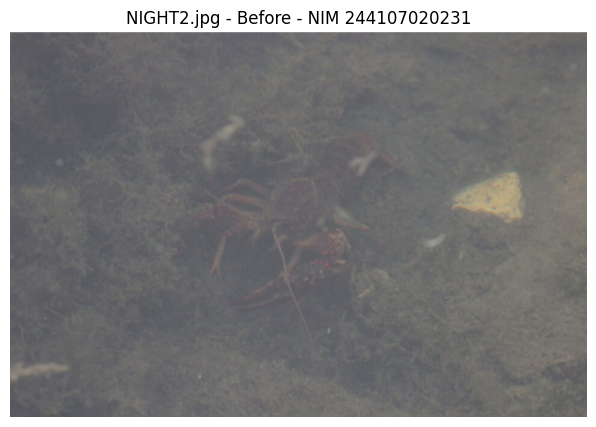

In [ ]:
plt.figure(figsize=(8, 5))

plt.imshow(
    cv2.cvtColor(night2, cv2.COLOR_BGR2RGB)
)

plt.title('NIGHT2.jpg - Before - NIM 244107020231')
plt.axis('off')

plt.show()

# Fungsi Gamma Correction

In [ ]:
def gamma_correction(image, gamma):
    normalized = image / 255.0

    corrected = np.power(
        normalized,
        gamma
    )

    corrected = np.clip(
        corrected * 255,
        0,
        255
    ).astype(np.uint8)

    return corrected

# Fungsi Contrast

In [ ]:
def contrast_correction(image, alpha):
    result = image.astype(np.float32) * alpha

    result = np.clip(
        result,
        0,
        255
    ).astype(np.uint8)

    return result

# Percobaan Gamma

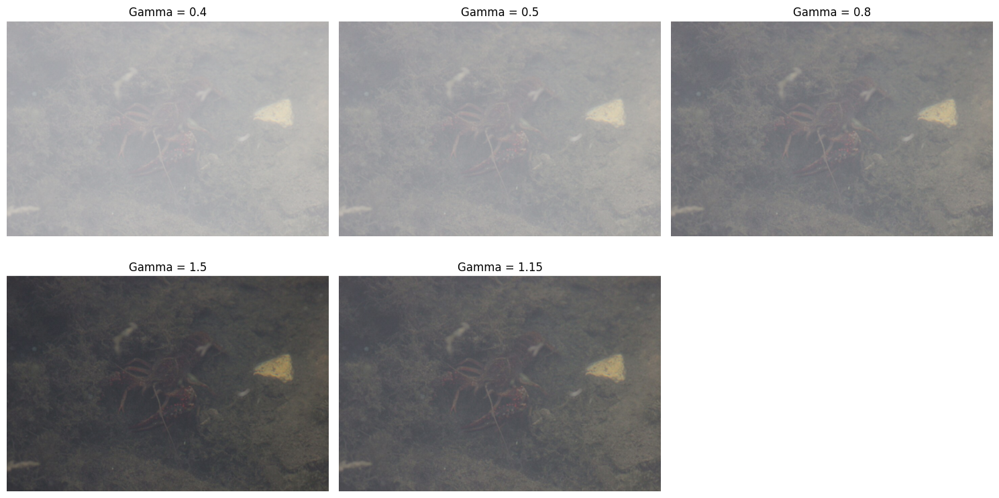

In [ ]:
gamma_values = [0.4, 0.5, 0.8, 1.5, 1.15]

plt.figure(figsize=(15, 8))

for i, gamma in enumerate(gamma_values):

    result = gamma_correction(
        night2,
        gamma
    )

    plt.subplot(2, 3, i + 1)

    plt.imshow(
        cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
    )

    plt.title(f'Gamma = {gamma}')
    plt.axis('off')

plt.tight_layout()
plt.show()

# Percobaan Contrast

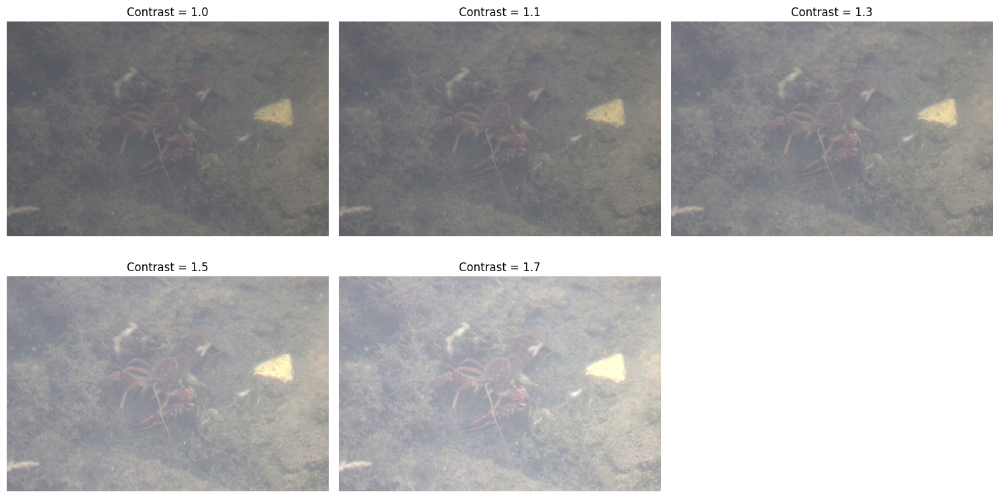

In [ ]:
alpha_values = [1.0, 1.1, 1.3, 1.5, 1.7]

plt.figure(figsize=(15, 8))

for i, alpha in enumerate(alpha_values):

    result = contrast_correction(
        night2,
        alpha
    )

    plt.subplot(2, 3, i + 1)

    plt.imshow(
        cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
    )

    plt.title(f'Contrast = {alpha}')
    plt.axis('off')

plt.tight_layout()
plt.show()

# Kombinasi Gamma + Contrast

In [ ]:
gamma_best = 1.15
alpha_best = 1.7

# Tahap 1: Gamma Correction
gamma_result = gamma_correction(
    night2,
    gamma_best
)

# Tahap 2: Contrast
final_result = contrast_correction(
    gamma_result,
    alpha_best
)

# Before vs After

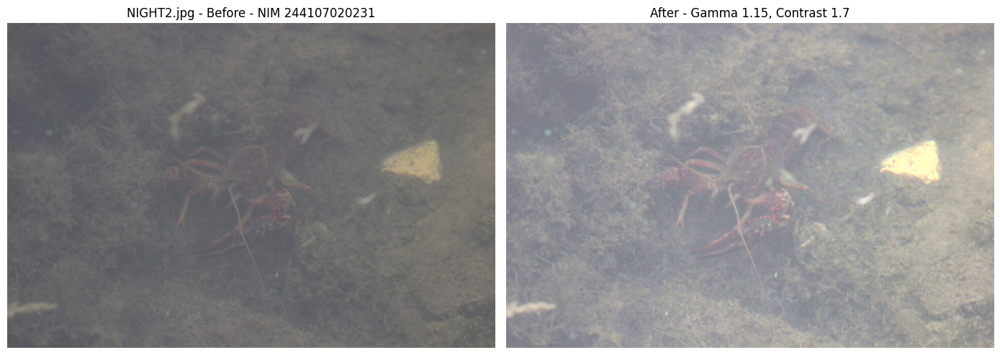

In [ ]:
plt.figure(figsize=(14, 6))

# BEFORE
plt.subplot(1, 2, 1)

plt.imshow(
    cv2.cvtColor(night2, cv2.COLOR_BGR2RGB)
)

plt.title(
    'NIGHT2.jpg - Before - NIM 244107020231'
)

plt.axis('off')


# AFTER
plt.subplot(1, 2, 2)

plt.imshow(
    cv2.cvtColor(final_result, cv2.COLOR_BGR2RGB)
)

plt.title(
    f'After - Gamma {gamma_best}, '
    f'Contrast {alpha_best}'
)

plt.axis('off')

plt.tight_layout()
plt.show()

# Mencari kombinasi parameter

In [ ]:
gamma_values = [1.0, 1.15, 1.20, 1.25]
alpha_values = [1.5, 1.6, 1.7]

results = []

for gamma in gamma_values:

    gamma_result = gamma_correction(
        night2,
        gamma
    )

    for alpha in alpha_values:

        result = contrast_correction(
            gamma_result,
            alpha
        )

        results.append(
            (gamma, alpha, result)
        )

# Tampilkan semua kombinasi

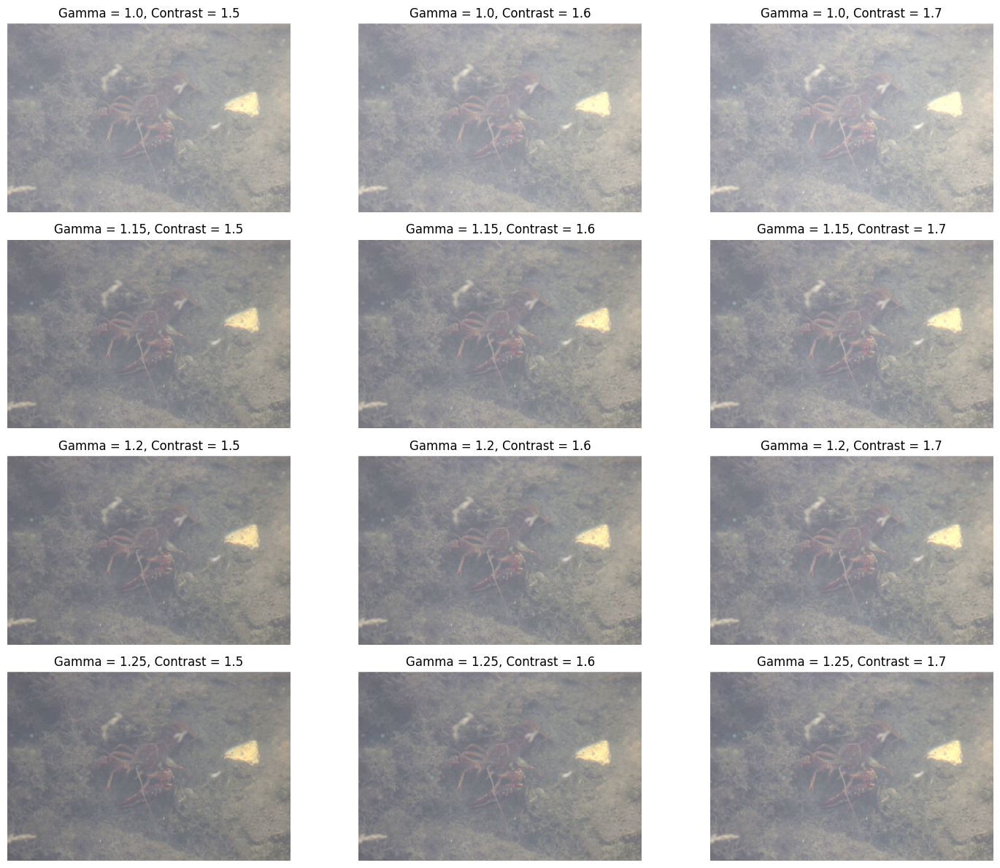

In [ ]:
plt.figure(figsize=(15, 12))

for i, (gamma, alpha, result) in enumerate(results):

    plt.subplot(4, 3, i + 1)

    plt.imshow(
        cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
    )

    plt.title(
        f'Gamma = {gamma}, Contrast = {alpha}'
    )

    plt.axis('off')

plt.tight_layout()
plt.show()

# Parameter Akhir

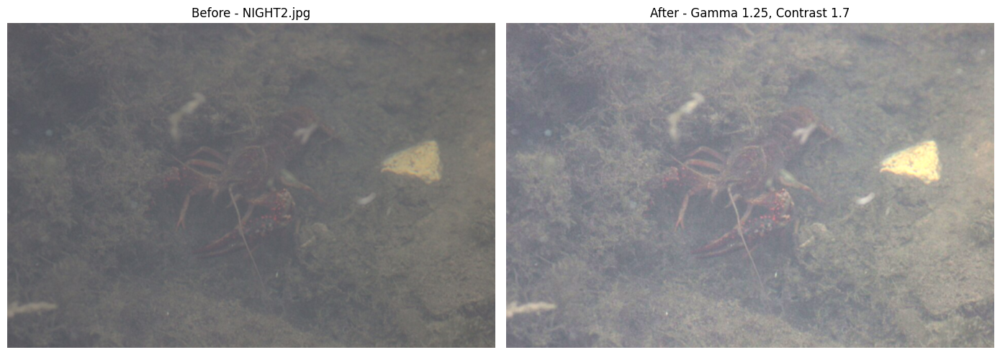

In [ ]:
gamma_best = 1.25
alpha_best = 1.7

gamma_result = gamma_correction(
    night2,
    gamma_best
)

final_result = contrast_correction(
    gamma_result,
    alpha_best
)

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(night2, cv2.COLOR_BGR2RGB))
plt.title('Before - NIGHT2.jpg')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(final_result, cv2.COLOR_BGR2RGB))
plt.title('After - Gamma 1.25, Contrast 1.7')
plt.axis('off')

plt.tight_layout()
plt.show()

Berdasarkan percobaan beberapa kombinasi parameter, dipilih Gamma Correction dengan nilai gamma 1,25 dan Contrast dengan nilai 1,7. Kombinasi tersebut dipilih berdasarkan pengamatan visual karena mampu meningkatkan perbedaan intensitas antara objek utama dengan latar belakang. Nilai gamma 1,25 membuat citra sedikit lebih gelap sehingga bagian yang terlalu terang dapat dikendalikan, sedangkan contrast 1,7 mempertegas perbedaan antara bagian gelap dan terang. Hasil pengolahan membuat objek utama di bagian tengah lebih mudah dibedakan dari latar belakang dibandingkan citra sebelum diproses.